## TSP Heuristics

**Author:** Guilherme Cadori

**Date:** 13/06/2024


### Creating Instances

In [1]:
# Work libraries
import numpy as np
import random
import matplotlib.pyplot as plt
%matplotlib inline


In [2]:
# Setting a random seed
np.random.seed(4)


In [3]:
# Creating instances
# Instance size
n1 = 12
n2 = 20
n3 = 30
n4 = 60

# Support function
# Generating random coordinates
# Generates random instance of size 'size'
def generate_instance(size):
    return np.random.rand(size, 2)


In [4]:
# Generating instances
instances = [generate_instance(n1),
             generate_instance(n2),
             generate_instance(n3),
             generate_instance(n4)]


In [5]:
# Calculating the Euclidean distance matrix
# Support function to calculate Euclidean distance
def euclidean_distance(point1, point2):
    return np.linalg.norm(point1 - point2)

# Support functio to create a symmetric distance matrix
def calculate_distance_matrix(points):
    size = points.shape[0]
    distance_matrix = np.zeros((size, size))

    for i in range(size):
        for j in range(size):
            distance = euclidean_distance(points[i], points[j])
            distance_matrix[i, j] = distance
            distance_matrix[j, i] = distance

    return distance_matrix


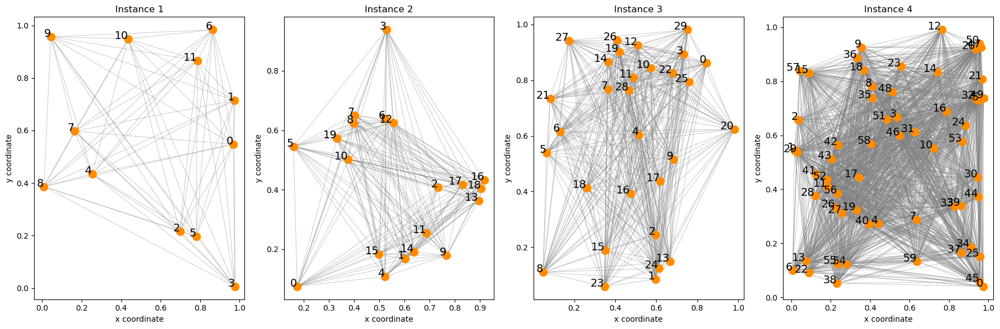

In [6]:
# Plotting instances side by side
fig, axs = plt.subplots(1, 4, figsize=(18, 6))

for idx, (ax, instance) in enumerate(zip(axs, instances), start=1):
    distance_matrix = calculate_distance_matrix(instance)
    
    # Plot edges
    for i in range(instance.shape[0]):
        for j in range(i + 1, instance.shape[0]):
            ax.plot([instance[i, 0], instance[j, 0]], 
                    [instance[i, 1], instance[j, 1]], 
                    c='gray', alpha=0.5, linewidth=0.6, zorder=1)
    
    # Plot points
    ax.scatter(instance[:, 0], instance[:, 1], c='darkorange', marker='o', s=100, zorder=2)
    
    # Plot text elements
    for i, (x, y) in enumerate(instance):
        ax.text(x, y, str(i), fontsize=14, ha='right', zorder=3)
    
    ax.set_title(f'Instance {idx}')
    ax.set_xlabel('x coordinate')
    ax.set_ylabel('y coordinate')

plt.tight_layout()
plt.show()


In [7]:
# Creating a distance matrix for each instance
# Empty list of distance matrices
distance_matrices = []

# Iterating over the list of instances
for instance in instances:
    # Calculating matrices
    distance_matrix = calculate_distance_matrix(instance)
    
    # Appending to list of distance_matrices
    distance_matrices.append(distance_matrix)


### Nearest Nighbor (NN)


In [8]:
# Nearest Neighbor heuristic
def nearest_neighbor(distance_matrix):
    n = distance_matrix.shape[0]
    visited = [False] * n
    tour = [0]  # Starting from the first city
    visited[0] = True  # Indicator for the first city
    total_cost = 0
    
    for _ in range(n - 1):
        last_visited = tour[-1]
        nearest_node = None
        nearest_distance = float('inf')  # Arbitrary large number

        for node in range(n):
            if not visited[node] and distance_matrix[last_visited, node] < nearest_distance:
                nearest_node = node
                nearest_distance = distance_matrix[last_visited, node]
                
        tour.append(nearest_node)
        visited[nearest_node] = True
        total_cost += nearest_distance
    
    # Appending last edge between the last visited node and the starting node
    total_cost += distance_matrix[tour[-1], tour[0]]
    tour.append(tour[0])
    
    return tour, total_cost


In [9]:
# Running NN for each instance
for idx, distance_matrix in enumerate(distance_matrices, start=1):
    tour = nearest_neighbor(distance_matrix)
    print(f"Instance {idx}: {tour}\n")
    

Tour for Instance 1: ([0, 1, 11, 6, 10, 9, 7, 4, 8, 2, 5, 3, 0], 3.7898918921766276)

Tour for Instance 2: ([0, 15, 4, 1, 14, 11, 9, 13, 18, 16, 17, 2, 12, 6, 7, 8, 19, 10, 5, 3, 0], 3.5588895216059786)

Tour for Instance 3: ([0, 25, 22, 3, 29, 10, 11, 28, 7, 14, 19, 26, 12, 4, 9, 17, 16, 2, 13, 24, 1, 23, 15, 18, 5, 6, 21, 27, 8, 20, 0], 5.822852869311179)

Tour for Instance 4: ([0, 45, 25, 34, 37, 39, 33, 44, 30, 53, 24, 32, 5, 49, 21, 20, 50, 47, 12, 14, 16, 10, 31, 46, 3, 51, 48, 35, 8, 18, 36, 9, 23, 58, 17, 56, 26, 27, 19, 40, 4, 7, 59, 54, 55, 38, 22, 13, 6, 28, 11, 52, 41, 43, 42, 29, 1, 2, 15, 57, 0], 7.249667863542072)



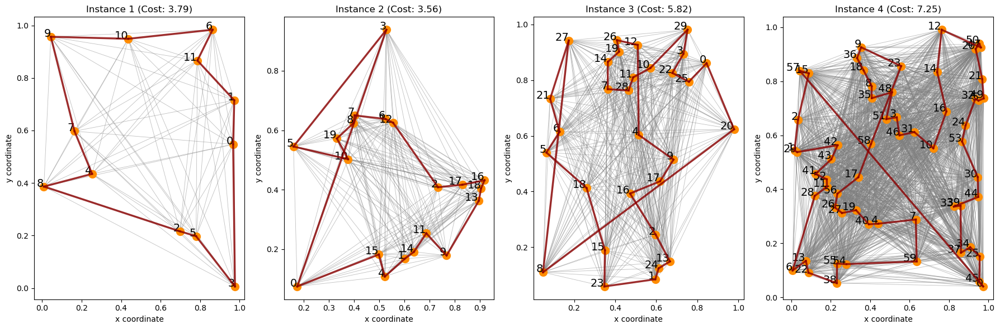

In [10]:
# Plotting instances side by side with the NN solution
fig, axs = plt.subplots(1, 4, figsize=(18, 6))

for idx, (ax, instance, distance_matrix) in enumerate(zip(axs, instances, distance_matrices), start=1):
    tour, total_cost = nearest_neighbor(distance_matrix)
    
    # Plot edges
    for i in range(instance.shape[0]):
        for j in range(i + 1, instance.shape[0]):
            ax.plot([instance[i, 0], instance[j, 0]], 
                    [instance[i, 1], instance[j, 1]], 
                    c='gray', alpha=0.5, linewidth=0.6, zorder=1)
    
    # Plot points
    ax.scatter(instance[:, 0], instance[:, 1], c='darkorange', marker='o', s=100, zorder=2)
    
    # Plot text elements
    for i, (x, y) in enumerate(instance):
        ax.text(x, y, str(i), fontsize=14, ha='right', zorder=3)
    
    # Plot the NN solution
    for i in range(len(tour) - 1):
        start, end = tour[i], tour[i + 1]
        ax.plot([instance[start, 0], instance[end, 0]], 
                [instance[start, 1], instance[end, 1]], 
                c='darkred', alpha=0.8, linewidth=2.5, zorder=4)
    
    ax.set_title(f'Instance {idx} (Cost: {total_cost:.2f})')
    ax.set_xlabel('x coordinate')
    ax.set_ylabel('y coordinate')

plt.tight_layout()
plt.show()


### n-Nearest Neighbor (n-NN)

In [32]:
def n_nearest_neighbors_cheapest_arc(distance_matrix):
    n = distance_matrix.shape[0]
    visited = [False] * n
    tour = [0]  # Start with the first city
    visited[0] = True
    total_cost = 0
    
    while len(tour) < n:
        best_cost = float('inf')
        best_city = None
        
        for current_city in tour:
            for next_city in range(n):
                if not visited[next_city]:
                    cost = distance_matrix[current_city, next_city]
                    if cost < best_cost:
                        best_cost = cost
                        best_city = next_city
        
        tour.append(best_city)
        visited[best_city] = True
        total_cost += best_cost
    
    # Return to the starting city
    total_cost += distance_matrix[tour[-1], tour[0]]
    tour.append(tour[0])
    
    return tour, total_cost


In [34]:
# Running n-NN for each instance
for idx, distance_matrix in enumerate(distance_matrices, start=1):
    tour = n_nearest_neighbors_cheapest_arc(distance_matrix)
    print(f"Instance {idx}: {tour}\n")


Instance 1: ([0, 1, 11, 6, 10, 9, 7, 4, 8, 5, 2, 3, 0], 3.408650989109609)

Instance 2: ([0, 15, 4, 1, 14, 11, 9, 2, 17, 18, 16, 13, 12, 6, 7, 8, 19, 10, 5, 3, 0], 3.1968383234944286)

Instance 3: ([0, 25, 22, 3, 29, 10, 11, 28, 7, 14, 19, 26, 12, 4, 9, 17, 16, 2, 13, 24, 1, 27, 18, 21, 6, 5, 15, 23, 20, 8, 0], 4.963254885073232)

Instance 4: ([0, 45, 25, 34, 37, 39, 33, 44, 30, 53, 24, 32, 5, 49, 21, 16, 20, 50, 47, 10, 31, 46, 3, 51, 48, 35, 8, 18, 36, 9, 23, 58, 17, 56, 26, 27, 11, 52, 41, 28, 19, 43, 42, 40, 4, 29, 1, 2, 14, 12, 15, 57, 54, 55, 38, 22, 13, 6, 7, 59, 0], 5.392220916848465)



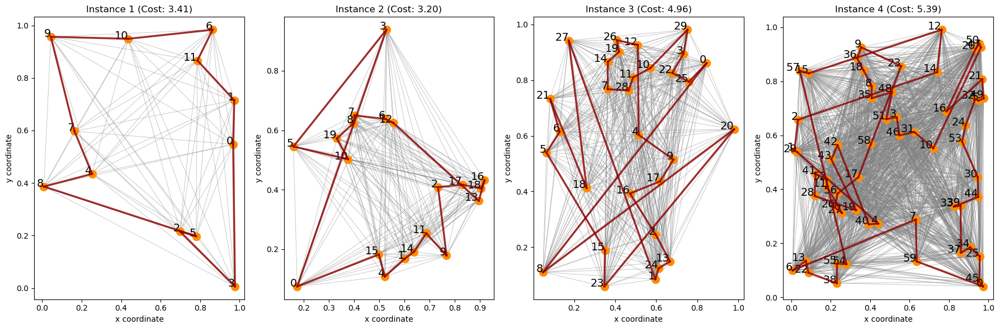

In [14]:
# Plotting instances with the n-nearest neighbors heuristic solution
fig, axs = plt.subplots(1, 4, figsize=(18, 6))
axs = axs.flatten()  # Flatten to make it easier to iterate

for idx, (ax, instance, distance_matrix) in enumerate(zip(axs, instances, distance_matrices), start=1):
    if idx > len(instances):  # Hide any unused subplots
        ax.axis('off')
        continue

    tour, total_cost = n_nearest_neighbors_cheapest_arc(distance_matrix)
    
    # Plot edges
    for i in range(instance.shape[0]):
        for j in range(i + 1, instance.shape[0]):
            ax.plot([instance[i, 0], instance[j, 0]], 
                    [instance[i, 1], instance[j, 1]], 
                    c='gray', alpha=0.5, linewidth=0.6, zorder=1)
    
    # Plot points
    ax.scatter(instance[:, 0], instance[:, 1], c='darkorange', marker='o', s=100, zorder=2)
    
    # Plot text elements
    for i, (x, y) in enumerate(instance):
        ax.text(x, y, str(i), fontsize=14, ha='right', zorder=3)
    
    # Plot the n-nearest neighbors heuristic solution
    for i in range(len(tour) - 1):
        start, end = tour[i], tour[i + 1]
        ax.plot([instance[start, 0], instance[end, 0]], 
                [instance[start, 1], instance[end, 1]], 
                c='darkred', alpha=0.8, linewidth=2.5, zorder=4)
    
    ax.set_title(f'Instance {idx} (Cost: {total_cost:.2f})')
    ax.set_xlabel('x coordinate')
    ax.set_ylabel('y coordinate')

plt.tight_layout()
plt.show()


### Nearest Insertion

In [15]:
# Nearest Insertion heuristic
def nearest_insertion(distance_matrix):
    n = distance_matrix.shape[0]
    visited = [False] * n
    tour = [0, 1, 0]  # Start with a tour containing two cities (0 and 1)
    visited[0] = True
    visited[1] = True
    total_cost = distance_matrix[0, 1] + distance_matrix[1, 0]
    
    while len(tour) - 1 < n:
        best_increase = float('inf')
        best_city = None
        best_position = None
        
        # Find the nearest unvisited city
        for city in range(n):
            if not visited[city]:
                # Find the closest city in the tour to this unvisited city
                for i in range(len(tour) - 1):
                    current_city = tour[i]
                    next_city = tour[i + 1]
                    increase = (distance_matrix[current_city, city] +
                                distance_matrix[city, next_city] -
                                distance_matrix[current_city, next_city])
                    if increase < best_increase:
                        best_increase = increase
                        best_city = city
                        best_position = i + 1
        
        # Insert the nearest city in the optimal position
        tour.insert(best_position, best_city)
        visited[best_city] = True
        total_cost += best_increase
    
    return tour, total_cost


In [16]:
# Running Nearest Insertion for each instance
for idx, distance_matrix in enumerate(distance_matrices, start=1):
    tour = nearest_insertion(distance_matrix)
    print(f"Instance {idx}: {tour}\n")
    

Tour for Instance 1: ([0, 3, 5, 2, 4, 8, 7, 9, 11, 10, 6, 1, 0], 4.277451204148706)

Tour for Instance 2: ([0, 5, 19, 7, 8, 3, 6, 12, 10, 15, 11, 2, 17, 16, 18, 13, 9, 14, 1, 4, 0], 3.479801548043673)

Tour for Instance 3: ([0, 20, 13, 24, 1, 2, 23, 15, 8, 18, 16, 17, 9, 4, 28, 11, 7, 6, 5, 21, 27, 14, 19, 26, 12, 10, 22, 3, 29, 25, 0], 5.137929069296241)

Tour for Instance 4: ([0, 45, 59, 40, 54, 38, 55, 22, 6, 13, 27, 26, 11, 28, 29, 1, 2, 57, 15, 41, 42, 43, 52, 56, 17, 19, 4, 7, 33, 39, 10, 46, 58, 51, 35, 8, 18, 36, 9, 23, 48, 3, 31, 16, 14, 12, 20, 50, 47, 32, 5, 21, 49, 53, 24, 30, 44, 37, 34, 25, 0], 7.424026821703857)



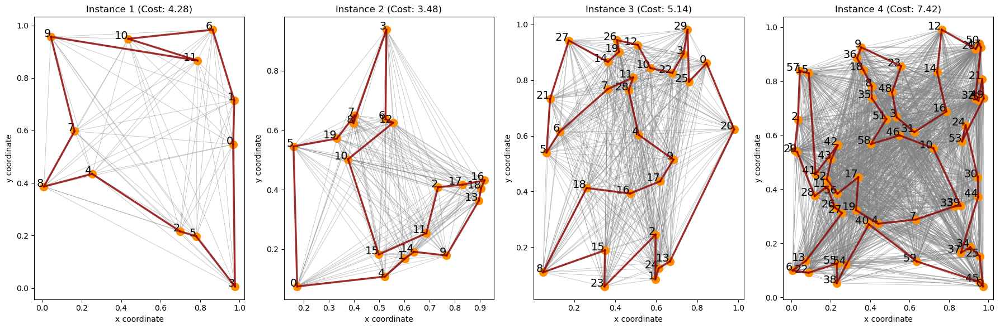

In [17]:
# Plotting instances side by side with the Nearest Insertion solution
fig, axs = plt.subplots(1, 4, figsize=(18, 6))

for idx, (ax, instance, distance_matrix) in enumerate(zip(axs, instances, distance_matrices), start=1):
    tour, total_cost = nearest_insertion(distance_matrix)
    
    # Plot edges
    for i in range(instance.shape[0]):
        for j in range(i + 1, instance.shape[0]):
            ax.plot([instance[i, 0], instance[j, 0]], 
                    [instance[i, 1], instance[j, 1]], 
                    c='gray', alpha=0.5, linewidth=0.6, zorder=1)
    
    # Plot points
    ax.scatter(instance[:, 0], instance[:, 1], c='darkorange', marker='o', s=100, zorder=2)
    
    # Plot text elements
    for i, (x, y) in enumerate(instance):
        ax.text(x, y, str(i), fontsize=14, ha='right', zorder=3)
    
    # Plot the Nearest Insertion solution
    for i in range(len(tour) - 1):
        start, end = tour[i], tour[i + 1]
        ax.plot([instance[start, 0], instance[end, 0]], 
                [instance[start, 1], instance[end, 1]], 
                c='darkred', alpha=0.8, linewidth=2.5, zorder=4)
    
    ax.set_title(f'Instance {idx} (Cost: {total_cost:.2f})')
    ax.set_xlabel('x coordinate')
    ax.set_ylabel('y coordinate')

plt.tight_layout()
plt.show()


### Farthest Insertion

In [18]:
# Farthest Insertion heuristic
def farthest_insertion(distance_matrix):
    n = distance_matrix.shape[0]
    visited = [False] * n
    tour = [0, 1, 0]  # Start with a tour containing two cities (0 and 1)
    visited[0] = True
    visited[1] = True
    total_cost = distance_matrix[0, 1] + distance_matrix[1, 0]
    
    while len(tour) - 1 < n:
        best_increase = float('inf')
        best_city = None
        best_position = None
        farthest_city = None
        max_distance = -1
        
        # Find the farthest unvisited city
        for city in range(n):
            if not visited[city]:
                # Find the closest city in the tour to this unvisited city
                for current_city in tour:
                    if current_city != tour[-1]:  # Ignore the last duplicate city
                        distance = distance_matrix[current_city, city]
                        if distance > max_distance:
                            max_distance = distance
                            farthest_city = city
        
        # Insert the farthest city in the optimal position
        for i in range(len(tour) - 1):
            current_city = tour[i]
            next_city = tour[i + 1]
            increase = (distance_matrix[current_city, farthest_city] +
                        distance_matrix[farthest_city, next_city] -
                        distance_matrix[current_city, next_city])
            if increase < best_increase:
                best_increase = increase
                best_position = i + 1
        
        tour.insert(best_position, farthest_city)
        visited[farthest_city] = True
        total_cost += best_increase
    
    return tour, total_cost


In [35]:
# Running Farthest Insertion for each instance
for idx, distance_matrix in enumerate(distance_matrices, start=1):
    tour = farthest_insertion(distance_matrix)
    print(f"Instance {idx}: {tour}\n")


Instance 1: ([0, 3, 5, 2, 4, 8, 7, 9, 10, 11, 6, 1, 0], 3.6336392672887694)

Instance 2: ([0, 5, 19, 10, 8, 7, 3, 6, 12, 2, 17, 16, 18, 13, 9, 11, 14, 1, 4, 15, 0], 3.0414560479513817)

Instance 3: ([0, 25, 22, 3, 29, 10, 28, 11, 12, 19, 26, 14, 7, 27, 21, 6, 5, 18, 8, 15, 23, 1, 24, 13, 2, 16, 17, 4, 9, 20, 0], 4.77852002306525)

Instance 4: ([0, 45, 25, 34, 33, 39, 44, 30, 53, 24, 10, 31, 16, 32, 5, 49, 21, 47, 50, 20, 12, 14, 23, 48, 3, 46, 51, 58, 35, 8, 18, 9, 36, 15, 57, 2, 1, 29, 42, 43, 41, 28, 52, 11, 56, 26, 27, 17, 19, 6, 13, 22, 38, 55, 54, 40, 4, 7, 59, 37, 0], 6.466173190825926)



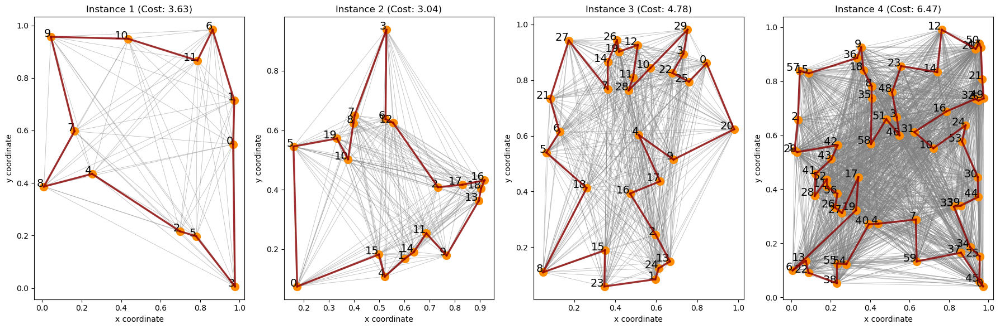

In [20]:
# Plotting instances side by side with the Farthest Insertion solution
fig, axs = plt.subplots(1, 4, figsize=(18, 6))

for idx, (ax, instance, distance_matrix) in enumerate(zip(axs, instances, distance_matrices), start=1):
    tour, total_cost = farthest_insertion(distance_matrix)
    
    # Plot edges
    for i in range(instance.shape[0]):
        for j in range(i + 1, instance.shape[0]):
            ax.plot([instance[i, 0], instance[j, 0]], 
                    [instance[i, 1], instance[j, 1]], 
                    c='gray', alpha=0.5, linewidth=0.6, zorder=1)
    
    # Plot points
    ax.scatter(instance[:, 0], instance[:, 1], c='darkorange', marker='o', s=100, zorder=2)
    
    # Plot text elements
    for i, (x, y) in enumerate(instance):
        ax.text(x, y, str(i), fontsize=14, ha='right', zorder=3)
    
    # Plot the Farthest Insertion solution
    for i in range(len(tour) - 1):
        start, end = tour[i], tour[i + 1]
        ax.plot([instance[start, 0], instance[end, 0]], 
                [instance[start, 1], instance[end, 1]], 
                c='darkred', alpha=0.8, linewidth=2.5, zorder=4)
    
    ax.set_title(f'Instance {idx} (Cost: {total_cost:.2f})')
    ax.set_xlabel('x coordinate')
    ax.set_ylabel('y coordinate')

plt.tight_layout()
plt.show()


### Farthest Insertion with 2-Opt

In [21]:
# 2-Opt algorithm
def two_opt(tour, distance_matrix):
    n = len(tour) - 1
    improvement = True
    while improvement:
        improvement = False
        for i in range(1, n - 1):
            for j in range(i + 1, n):
                if j - i == 1: continue  # Skip adjacent nodes
                # Calculate the change in distance if we perform the 2-opt move
                delta = (distance_matrix[tour[i-1], tour[j]] +
                         distance_matrix[tour[i], tour[j+1]] -
                         distance_matrix[tour[i-1], tour[i]] -
                         distance_matrix[tour[j], tour[j+1]])
                if delta < 0:
                    # Perform the 2-opt move by reversing the segment between i and j
                    tour[i:j+1] = reversed(tour[i:j+1])
                    improvement = True
    # Calculate the total cost of the improved tour
    total_cost = sum(distance_matrix[tour[i], tour[i+1]] for i in range(len(tour) - 1))
    return tour, total_cost


In [22]:
# Running Farthest Insertion and then 2-Opt for each instance and printing the results
for idx, distance_matrix in enumerate(distance_matrices, start=1):
    initial_tour, initial_cost = farthest_insertion(distance_matrix)
    improved_tour, improved_cost = two_opt(initial_tour, distance_matrix)
    print(f"Initial Cost for Instance {idx}: {initial_cost:.2f}")
    print(f"Improved Cost for Instance {idx}: {improved_cost:.2f}")
    print(f"Initial Tour for Instance {idx}: {initial_tour}")
    print(f"Improved Tour for Instance {idx}: {improved_tour}\n")


Initial Cost for Instance 1: 3.63
Improved Cost for Instance 1: 3.63
Initial Tour for Instance 1: [0, 3, 5, 2, 4, 8, 7, 9, 10, 11, 6, 1, 0]
Improved Tour for Instance 1: [0, 3, 5, 2, 4, 8, 7, 9, 10, 11, 6, 1, 0]

Initial Cost for Instance 2: 3.04
Improved Cost for Instance 2: 3.04
Initial Tour for Instance 2: [0, 5, 19, 10, 8, 7, 3, 6, 12, 2, 17, 16, 18, 13, 9, 11, 14, 1, 4, 15, 0]
Improved Tour for Instance 2: [0, 5, 19, 10, 8, 7, 3, 6, 12, 2, 17, 16, 18, 13, 9, 11, 14, 1, 4, 15, 0]

Initial Cost for Instance 3: 4.78
Improved Cost for Instance 3: 4.73
Initial Tour for Instance 3: [0, 25, 20, 9, 4, 17, 16, 2, 13, 24, 1, 23, 15, 8, 18, 5, 6, 21, 27, 7, 14, 26, 19, 12, 11, 28, 10, 22, 3, 29, 0]
Improved Tour for Instance 3: [0, 25, 20, 9, 4, 17, 16, 2, 13, 24, 1, 23, 15, 8, 18, 5, 6, 21, 27, 7, 14, 26, 19, 12, 11, 28, 10, 22, 3, 29, 0]

Initial Cost for Instance 4: 6.47
Improved Cost for Instance 4: 6.44
Initial Tour for Instance 4: [0, 45, 37, 59, 7, 4, 40, 54, 55, 38, 22, 13, 6, 26, 27

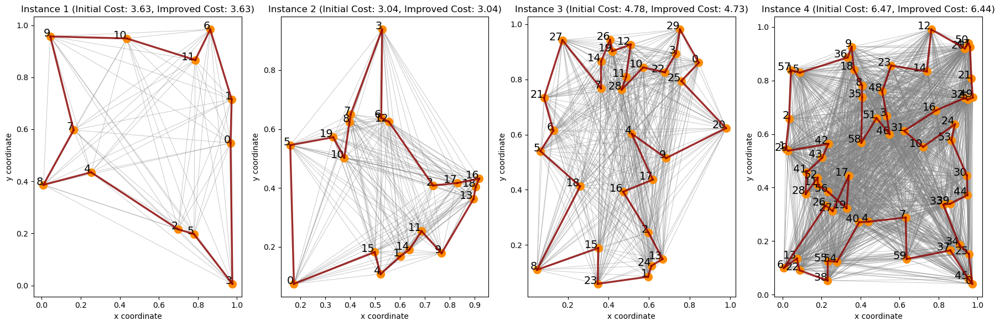

In [23]:
# Plotting instances side by side with the 2-Opt improved solution
fig, axs = plt.subplots(1, 4, figsize=(18, 6))

for idx, (ax, instance, distance_matrix) in enumerate(zip(axs, instances, distance_matrices), start=1):
    initial_tour, initial_cost = farthest_insertion(distance_matrix)
    improved_tour, improved_cost = two_opt(initial_tour, distance_matrix)
    
    # Plot edges
    for i in range(instance.shape[0]):
        for j in range(i + 1, instance.shape[0]):
            ax.plot([instance[i, 0], instance[j, 0]], 
                    [instance[i, 1], instance[j, 1]], 
                    c='gray', alpha=0.5, linewidth=0.6, zorder=1)
    
    # Plot points
    ax.scatter(instance[:, 0], instance[:, 1], c='darkorange', marker='o', s=100, zorder=2)
    
    # Plot text elements
    for i, (x, y) in enumerate(instance):
        ax.text(x, y, str(i), fontsize=14, ha='right', zorder=3)
    
    # Plot the 2-Opt improved solution
    for i in range(len(improved_tour) - 1):
        start, end = improved_tour[i], improved_tour[i + 1]
        ax.plot([instance[start, 0], instance[end, 0]], 
                [instance[start, 1], instance[end, 1]], 
                c='darkred', alpha=0.8, linewidth=2.5, zorder=4)
    
    ax.set_title(f'Instance {idx} (Initial Cost: {initial_cost:.2f}, Improved Cost: {improved_cost:.2f})')
    ax.set_xlabel('x coordinate')
    ax.set_ylabel('y coordinate')

plt.tight_layout()
plt.show()


### Final Comparison of Solutions

Nearest Neighbor Solutions


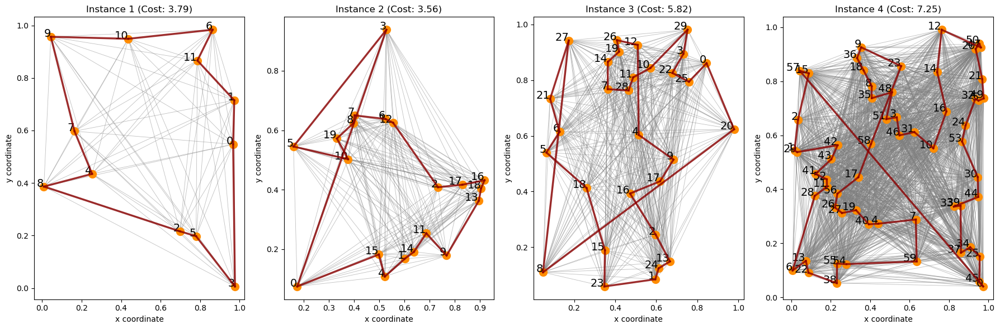

n-Nearest Neighbors Solutions


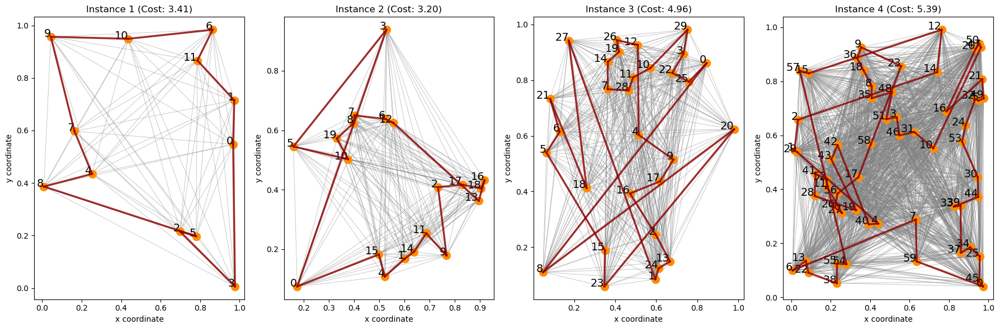

Nearest Insertion Solutions


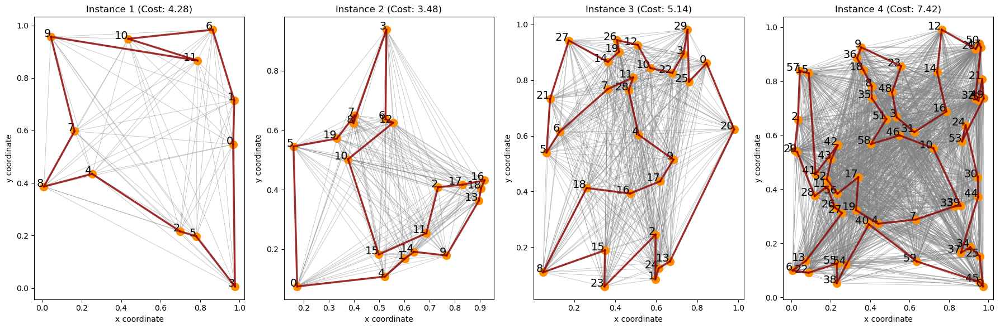

Farthest Insertion Solutions


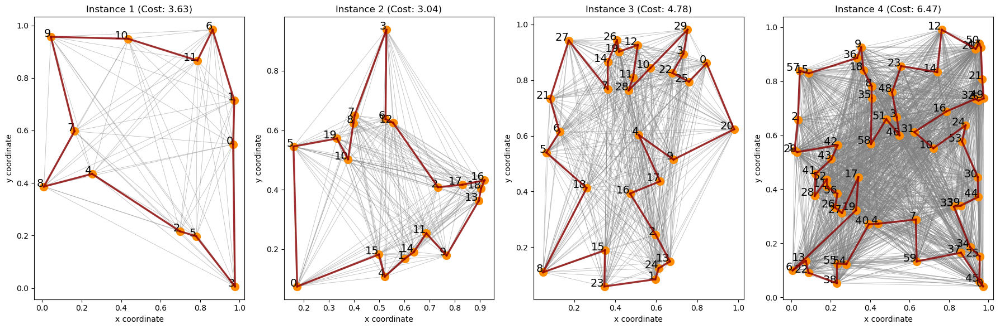

2-Opt Solutions


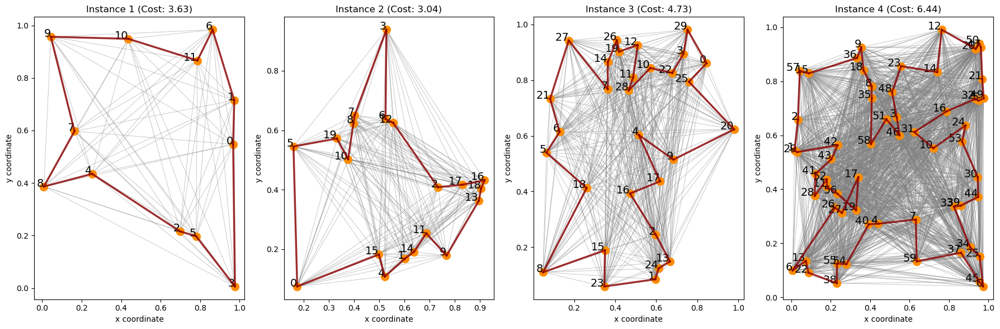

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Define your existing heuristics and other necessary functions (not shown here for brevity)
# Assume that we have the following heuristics:
# nearest_neighbor, n_nearest_neighbors_cheapest_arc, nearest_insertion, farthest_insertion, two_opt

# Assume instances and distance_matrices are already defined and calculated

# Define a function to plot the solutions
def plot_solutions(method_name, method_func, axs, instances, distance_matrices):
    for idx, (ax, instance, distance_matrix) in enumerate(zip(axs, instances, distance_matrices), start=1):
        if method_name == "2-Opt":
            initial_tour, initial_cost = farthest_insertion(distance_matrix)
            tour, total_cost = method_func(initial_tour, distance_matrix)
        else:
            tour, total_cost = method_func(distance_matrix)
        
        # Plot edges
        for i in range(instance.shape[0]):
            for j in range(i + 1, instance.shape[0]):
                ax.plot([instance[i, 0], instance[j, 0]], 
                        [instance[i, 1], instance[j, 1]], 
                        c='gray', alpha=0.5, linewidth=0.6, zorder=1)
        
        # Plot points
        ax.scatter(instance[:, 0], instance[:, 1], c='darkorange', marker='o', s=100, zorder=2)
        
        # Plot text elements
        for i, (x, y) in enumerate(instance):
            ax.text(x, y, str(i), fontsize=14, ha='right', zorder=3)
        
        # Plot the tour solution
        for i in range(len(tour) - 1):
            start, end = tour[i], tour[i + 1]
            ax.plot([instance[start, 0], instance[end, 0]], 
                    [instance[start, 1], instance[end, 1]], 
                    c='darkred', alpha=0.8, linewidth=2.5, zorder=4)
        
        ax.set_title(f'Instance {idx} (Cost: {total_cost:.2f})')
        ax.set_xlabel('x coordinate')
        ax.set_ylabel('y coordinate')
    
    plt.tight_layout()
    plt.show()

# Define the methods and their corresponding functions
methods = [
    ("Nearest Neighbor", nearest_neighbor),
    ("n-Nearest Neighbors", n_nearest_neighbors_cheapest_arc),
    ("Nearest Insertion", nearest_insertion),
    ("Farthest Insertion", farthest_insertion),
    ("2-Opt", two_opt)
]

# Plot solutions for each method
for method_name, method_func in methods:
    print(f"{method_name} Solutions")
    fig, axs = plt.subplots(1, 4, figsize=(18, 6))
    plot_solutions(method_name, method_func, axs, instances, distance_matrices)


In [28]:
import pandas as pd

# Assume instances and distance_matrices are already defined and calculated

# Define the methods and their corresponding functions
methods = [
    ("Nearest Neighbor", nearest_neighbor),
    ("n-Nearest Neighbors", n_nearest_neighbors_cheapest_arc),
    ("Nearest Insertion", nearest_insertion),
    ("Farthest Insertion", farthest_insertion),
    ("Farthest Insertion + 2-Opt", lambda dist_matrix: two_opt(farthest_insertion(dist_matrix)[0], dist_matrix))
]

# Initialize a dictionary to store results
results = {method[0]: [] for method in methods}

# Run each method for all instances and store the results
for method_name, method_func in methods:
    for distance_matrix in distance_matrices:
        if method_name == "Farthest Insertion + 2-Opt":
            tour, total_cost = method_func(distance_matrix)
        else:
            tour, total_cost = method_func(distance_matrix)
        results[method_name].append(total_cost)

# Convert the results dictionary to a DataFrame for better visualization
summary_df = pd.DataFrame(results)
summary_df.index += 1  # To start the index from 1 instead of 0
summary_df.index.name = 'Instance'

# Print the summary table
summary_df


,Nearest Neighbor,n-Nearest Neighbors,Nearest Insertion,Farthest Insertion,Farthest Insertion + 2-Opt
Instance,,,,,
1,3.789892,3.408651,4.277451,3.633639,3.633639
2,3.558890,3.196838,3.479802,3.041456,3.041456
3,5.822853,4.963255,5.137929,4.778520,4.730398
4,7.249668,5.392221,7.424027,6.466173,6.444697


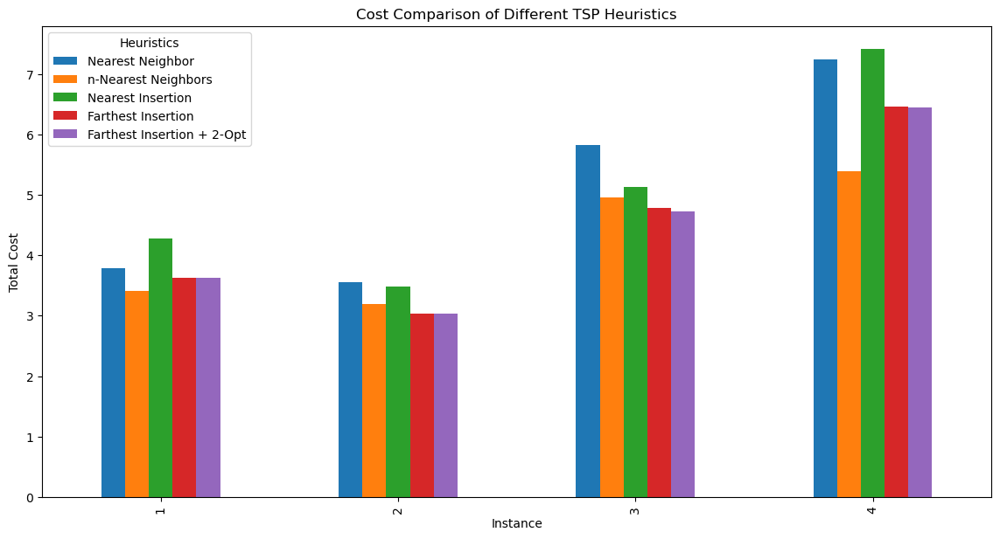

In [31]:
# Plotting the summary results
summary_df.plot(kind='bar', figsize=(14, 7))

plt.title("Cost Comparison of Different TSP Heuristics")
plt.xlabel("Instance")
plt.ylabel("Total Cost")
plt.legend(title="Heuristics")
plt.xticks(rotation=90)
plt.show()


***
**End**
***